In [1]:
# Import Library

import sys
# the mock-0.3.1 dir contains testcase.py, testutils.py & mock.py
sys.path.append('c:\programdata\miniconda3\lib\site-packages')


import numpy as np
import pandas as pd 
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os

import tensorflow as tf
from tensorflow import keras



Using TensorFlow backend.


In [2]:
# Define Constants

FAST_RUN = False

#IMAGE_WIDTH=128
#IMAGE_HEIGHT=128


IMAGE_WIDTH =256
IMAGE_HEIGHT=256


IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

#TRAIN_DIR = (r'c:\Users\SERGEI\Pictures\Art\v_data\train')
#TEST_DIR = (r'c:\Users\SERGEI\Pictures\Art\v_data\test')
#
#CTG_A = 'cars'
#CTG_B = 'planes'

TRAIN_DIR = (r'c:\Users\SERGEI\Pictures\Art\sc_data\train')
TEST_DIR = (r'c:\Users\SERGEI\Pictures\Art\sc_data\test3')
TEST2_DIR = (r'c:\Users\SERGEI\Pictures\Art\sc_data\tttt')

CTG_A = 'ar' # Rodin
CTG_B = 'ma' # Michelangelo



In [3]:

def getListOfFiles(dirName):
    # create a list of file and sub directories 
    # names in the given directory 
    listOfFile = os.listdir(dirName)
    allFiles = list()
    # Iterate over all the entries
    for entry in listOfFile:
        # Create full path
        fullPath = os.path.join(dirName, entry)
        # If entry is a directory then get the list of files in this directory 
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
            allFiles.append(fullPath)
                
    return allFiles

In [4]:

# Возвращает короткую последовательную модель
def create_model():
  model = tf.keras.models.Sequential([
    keras.layers.Dense(512, activation=tf.nn.relu, input_shape=(784,)),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(10, activation=tf.nn.softmax)
  ])
  model.compile(optimizer=tf.train.AdamOptimizer(),
                loss=tf.keras.losses.sparse_categorical_crossentropy,
                metrics=['accuracy'])

  return model
########################################################3

In [5]:
# Prepare Traning Data
print(os.listdir(TRAIN_DIR))

###filenames = os.listdir("../input/train/train")
filenames = getListOfFiles(TRAIN_DIR)
#print('filenames=',filenames)
print('len(filenames)',len(filenames))

['ar', 'ma']
len(filenames) 310


In [6]:
categories = []
for filename in filenames:
    #category = filename.split('.')[0]
    if CTG_A in filename:
        category = CTG_A
        categories.append(1)
    else:        
        category = CTG_B
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

In [7]:
#print('df=',df)
print('df.head=',df.head(1))
print('df.tail=',df.tail(1))

df.head=                                             filename  category
0  c:\Users\SERGEI\Pictures\Art\sc_data\train\ar\...         1
df.tail=                                               filename  category
309  c:\Users\SERGEI\Pictures\Art\sc_data\train\ma\...         0


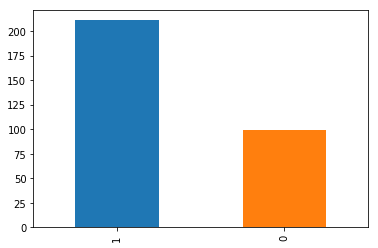

In [8]:
df['category'].value_counts().plot.bar()

c:\Users\SERGEI\Pictures\Art\sc_data\train\ma\David-Michelangelo-de-face-et-de-dos.jpg


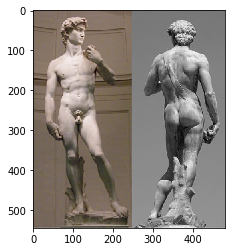

In [9]:
sample = random.choice(filenames)
print(sample)
image = load_img(sample)
plt.imshow(image)

In [10]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax')) # 2 because we have cat and dog classes

model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model.summary()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 254, 254, 32)      896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 254, 254, 32)      128       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 127, 127, 32)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
batch_normalization_2

In [11]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [12]:
earlystop = EarlyStopping(patience=10)
#earlystop = EarlyStopping(patience=20)

In [13]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

In [14]:
callbacks = [earlystop, learning_rate_reduction]

In [15]:
df["category"] = df["category"].replace({0: CTG_B, 1: CTG_A})

print('df.head=',df.head(1))
print('df.tail=',df.tail(1))

df.head=                                             filename category
0  c:\Users\SERGEI\Pictures\Art\sc_data\train\ar\...       ar
df.tail=                                               filename category
309  c:\Users\SERGEI\Pictures\Art\sc_data\train\ma\...       ma


In [16]:
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

len_train_df = len(train_df)
len_validate_df = len(validate_df)

print('len_train_df=',len_train_df)
print('len_validate_df=',len_validate_df)

len_train_df= 248
len_validate_df= 62


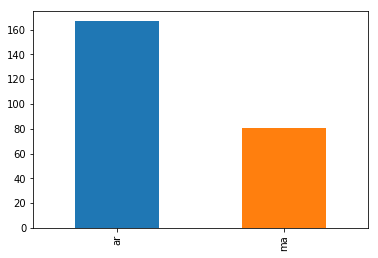

In [17]:
train_df['category'].value_counts().plot.bar()

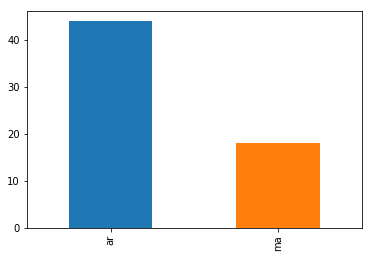

In [18]:
validate_df['category'].value_counts().plot.bar()

In [19]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size=15

In [20]:
# Traning Generator

train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    TRAIN_DIR, 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 226 images belonging to 2 classes.


In [21]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    TRAIN_DIR, 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 55 images belonging to 2 classes.


In [22]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen.flow_from_dataframe(
    example_df, 
    TRAIN_DIR, 
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical'
)

Found 0 images belonging to 0 classes.


ZeroDivisionError: integer division or modulo by zero

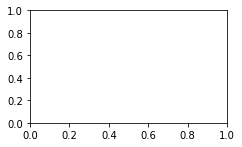

In [23]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

In [24]:
###epochs=3 if FAST_RUN else 50
epochs= 50
history = model.fit_generator(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Instructions for updating:
Use tf.cast instead.
Epoch 1/50
16/16 [==============================] - 124s 8s/step - loss: 1.5082 - acc: 0.6153 - val_loss: 1.6355 - val_acc: 0.5091
Epoch 2/50
16/16 [==============================] - 105s 7s/step - loss: 1.1850 - acc: 0.6529 - val_loss: 0.7249 - val_acc: 0.6364
Epoch 3/50
16/16 [==============================] - 97s 6s/step - loss: 0.9264 - acc: 0.6356 - val_loss: 1.5490 - val_acc: 0.5636
Epoch 4/50
16/16 [==============================] - 91s 6s/step - loss: 0.8082 - acc: 0.7115 - val_loss: 1.9308 - val_acc: 0.6000

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 5/50
16/16 [==============================] - 84s 5s/step - loss: 0.6802 - acc: 0.7491 - val_loss: 1.3920 - val_acc: 0.6545
Epoch 6/50
16/16 [==============================] - 82s 5s/step - loss: 0.7989 - acc: 0.6858 - val_loss: 1.2570 - val_acc: 0.6182
Epoch 7/50
16/16 [==============================] - 77s 5s/step - loss: 0.8535 - acc: 0.6

In [147]:
model.save_weights(r"c:\Users\SERGEI\Pictures\Art\sc_data\model\model_190823_4.h5")

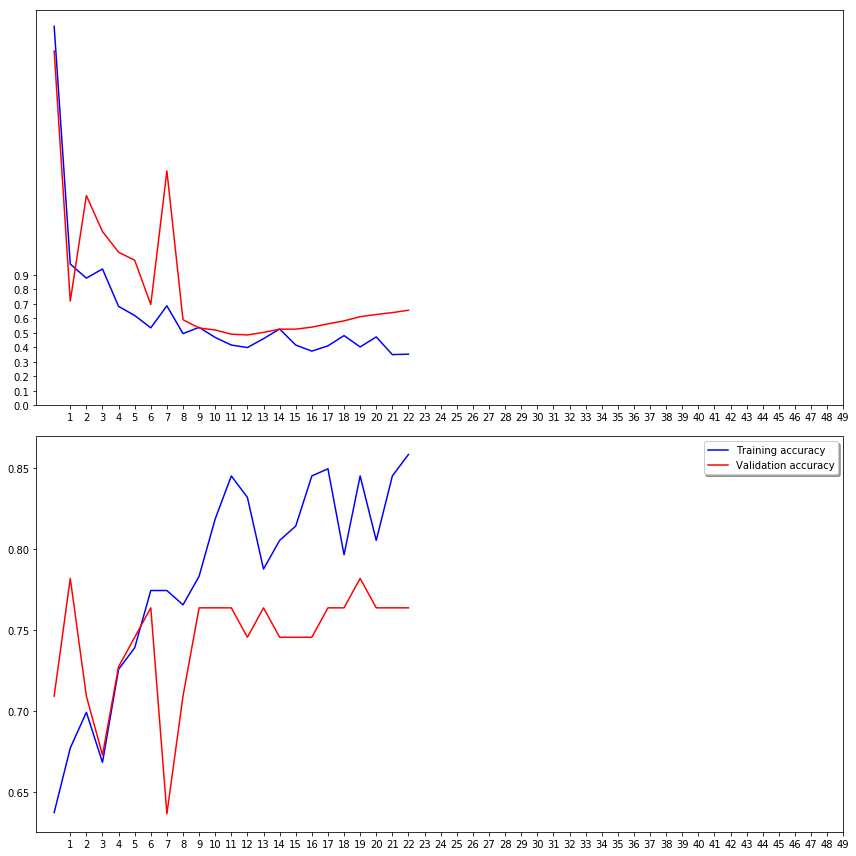

In [148]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(history.history['acc'], color='b', label="Training accuracy")
ax2.plot(history.history['val_acc'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

In [149]:

test_filenames = getListOfFiles(TEST_DIR)
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]

In [150]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    test_df, 
    TEST_DIR, 
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=IMAGE_SIZE,
    batch_size=batch_size,
    shuffle=False
)

Found 113 images.


In [151]:
predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))

len_predict = len(predict)
len_test_df = len(test_df)



print('len_predict=',len_predict)
print('len_test_df=',len_test_df)


#print('len(predict)',len(predict))



len_predict= 113
len_test_df= 113


In [152]:
#print('predict=',predict)

In [153]:
print('np.argmax(predict, axis=-1)=',np.argmax(predict, axis=-1))

print('test_df.head=',test_df.head(1))
print('test_df.tail=',test_df.tail(1))

print('len(test_df)',len(test_df))

np.argmax(predict, axis=-1)= [0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1
 1 1]
test_df.head=                                             filename
0  c:\Users\SERGEI\Pictures\Art\sc_data\test3\ar\...
test_df.tail=                                               filename
112  c:\Users\SERGEI\Pictures\Art\sc_data\test3\ma\...
len(test_df) 113


In [154]:
#for index, row in test_df.iterrows():
#    filename = row['filename']
#    
#    ###category = row['category']
#    category = index
#    ###img = load_img(filename, target_size=IMAGE_SIZE)
#    img = load_img(filename)
#    
#    #plt.subplot(6, 3, index+1)
#    plt.imshow(img)
#    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
#    plt.tight_layout()
#    plt.show()

In [155]:
test_df['category'] = np.argmax(predict, axis=-1)

In [156]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)

In [157]:
test_df['category'] = test_df['category'].replace({ CTG_A: 1, CTG_B: 0 })


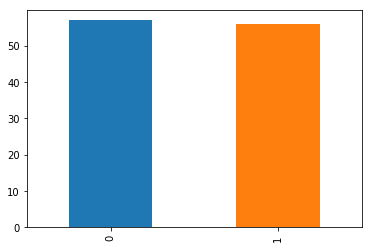

In [158]:
test_df['category'].value_counts().plot.bar()

In [159]:
#sample_test = test_df.head(18)
#sample_test.head()
#plt.figure(figsize=(12, 24))
#for index, row in sample_test.iterrows():
#    filename = row['filename']
#    category = row['category']
#    img = load_img(filename, target_size=IMAGE_SIZE)
#    plt.subplot(6, 3, index+1)
#    plt.imshow(img)
#    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
#plt.tight_layout()
#plt.show()

In [160]:
submission_df = test_df.copy()
submission_df['id'] = submission_df['filename'].str.split('.').str[0]
submission_df['label'] = submission_df['category']
submission_df.drop(['filename', 'category'], axis=1, inplace=True)
submission_df.to_csv(r'c:\Users\SERGEI\Pictures\Art\sc_data\model\submission.csv', index=False)

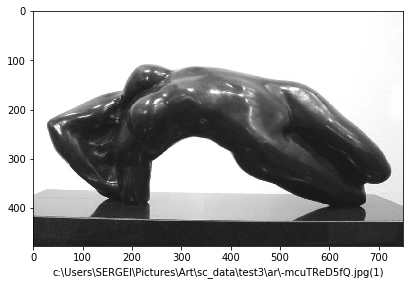

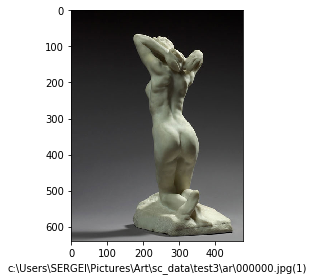

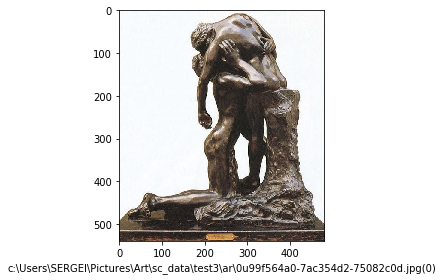

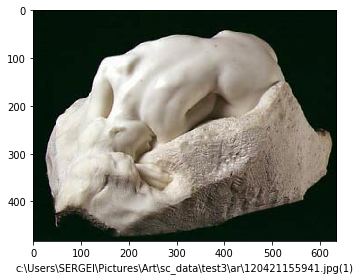

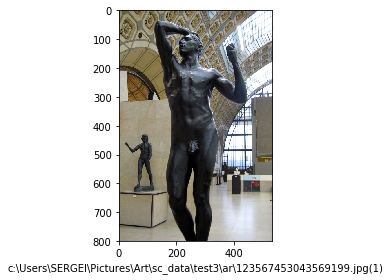

...

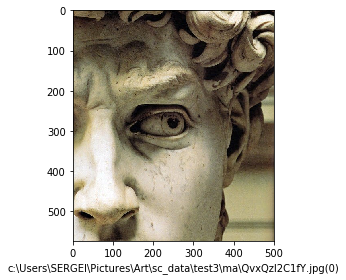

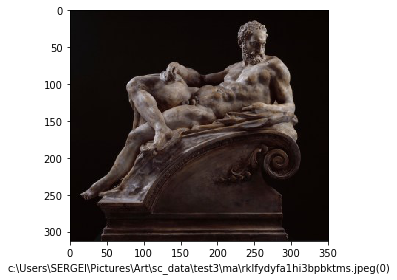

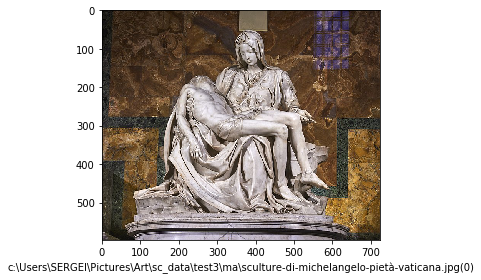

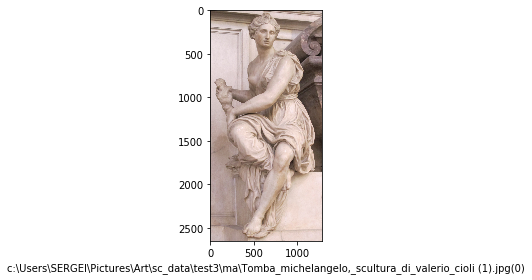

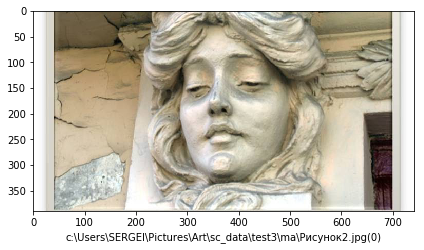

In [122]:
#sample_test = test_df.tail(18)
#sample_test.tail()

#sample_test = test_df.head(100)
#sample_test.head()

#plt.figure(figsize=(12, 24))
for index, row in test_df.iterrows():
    filename = row['filename']
    category = row['category']
    ###img = load_img(filename, target_size=IMAGE_SIZE)
    img = load_img(filename)
    #plt.subplot(6, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
    plt.tight_layout()
    plt.show()

In [132]:




#if os.path.exists(r"c:\Users\SERGEI\Pictures\Art\sc_data\model\model_190812_1.h5"):
#    
#    # Сохраняем веса
#    #model.save_weights('./checkpoints/my_checkpoint')
#
#    # Восстанавливаем веса
#    model2 = create_model()
#    #model2.load_weights('./checkpoints/my_checkpoint')    
#    model2.load_weights(r"c:\Users\SERGEI\Pictures\Art\v_data\model\model_190812_1.h5")
#
#
#    #loss,acc = load_weights.evaluate(test_images, test_labels)
#    #print("Восстановленная модель2, точность: {:5.2f}%".format(100*acc))    
#
#    print('model2 loaded!')